In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
# %matplotlib qt
# %matplotlib osx


sns.set_style("whitegrid")
sns.set_style("ticks")
from datetime import datetime
str(datetime.now())

# sns.set_palette('colorblind')


'2018-10-24 08:53:18.209954'

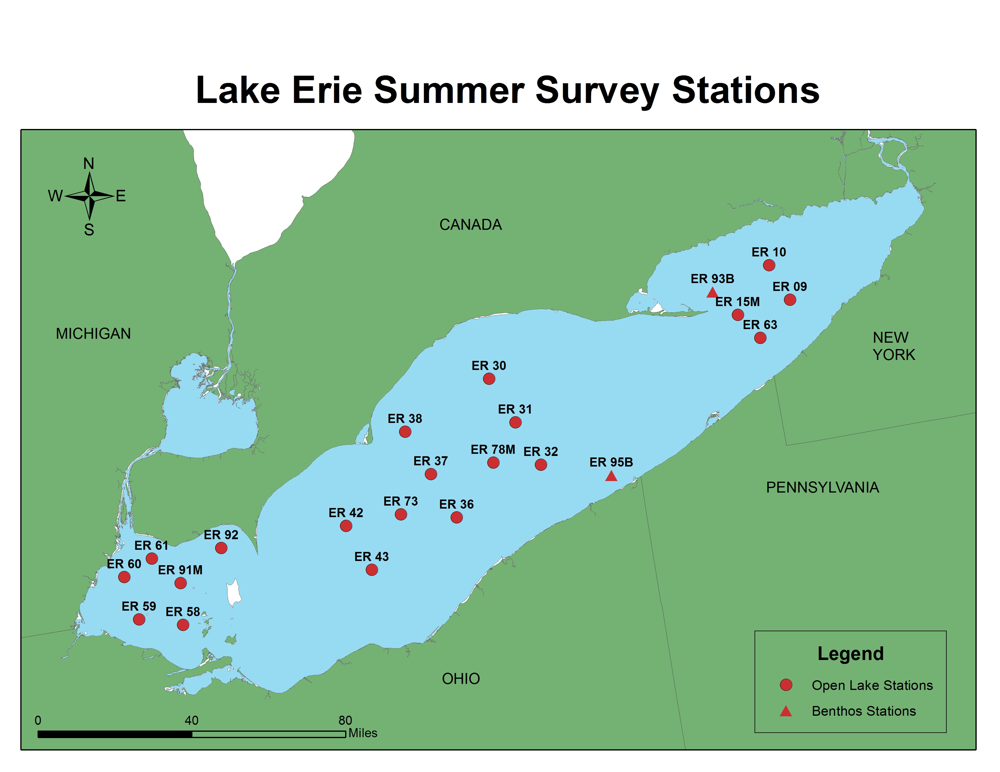

In [2]:
from IPython.display import Image
Image(filename='../../measurements/GLNPO/Erie_Summer_Survey2017.jpg') 

In [3]:
eastern_basin = ['ER15M', 'ER09', 'ER63', 'ER10']
central_basin = ['ER78M', 'ER38', 'ER37', 'ER42', 'ER30', 'ER73', 'ER36', 'ER32'] #, 'ER43','ER31']
western_basin = ['ER58', 'ER59', 'ER61', 'ER60', 'ER92', 'ER91M']

In [4]:
stations = eastern_basin + central_basin + western_basin
years = range(2003,2018)
seasons = ['Spring', 'Summer']

In [5]:
import numpy as np
from scipy import interpolate
import statsmodels.api as sm


/Users/imarkelo/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [6]:
Conductivity = pd.read_csv('../../measurements/GLNPO/Mass Balance/Conductivity.csv')
Conductivity = Conductivity[Conductivity.QC_TYPE=='routine field sample']
Conductivity = Conductivity[~Conductivity.DEPTH_CODE.isin(['Integrated, Spring', 'Integrated, Summer'])]
Conductivity = Conductivity[Conductivity.YEAR>2002]
Conductivity.loc[:,'SAMPLE_DEPTH_M'] *= -1
Conductivity.round({'SAMPLE_DEPTH_M': 0})
Conductivity = Conductivity[Conductivity['STATION_ID'].isin(eastern_basin + central_basin + western_basin)]
Conductivity = Conductivity[Conductivity['SEASON'].isin(seasons)]
Conductivity['Conductivity_conc'] = pd.to_numeric(Conductivity['VALUE_1'], errors='coerce')

In [37]:
Cl = pd.read_csv('../../measurements/GLNPO/Mass Balance/Cl.csv')
Cl = Cl[Cl.QC_TYPE=='routine field sample']
Cl = Cl[~Cl.DEPTH_CODE.isin(['Integrated, Spring', 'Integrated, Summer'])]
Cl = Cl[Cl.YEAR>2002]
Cl.loc[:,'SAMPLE_DEPTH_M'] *= -1
Cl.round({'SAMPLE_DEPTH_M': 0})
Cl = Cl[Cl['STATION_ID'].isin(eastern_basin + central_basin + western_basin)]
Cl = Cl[Cl['SEASON'].isin(seasons)]
Cl['Cl_conc'] = pd.to_numeric(Cl['VALUE_1'], errors='coerce')
Cl = Cl[Cl['Cl_conc']>8]

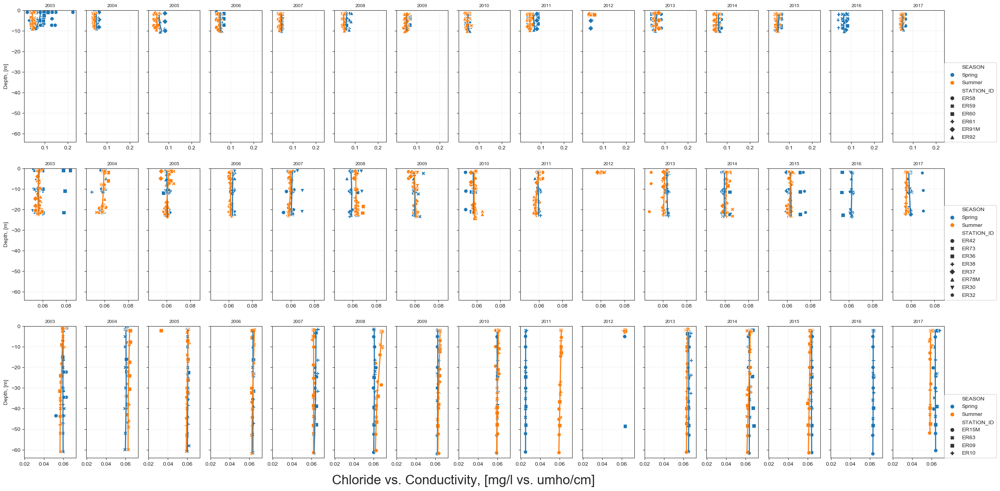

In [28]:
Cl = pd.read_csv('../../measurements/GLNPO/Mass Balance/Cl.csv')
Cl = Cl[Cl.QC_TYPE=='routine field sample']
Cl = Cl[~Cl.DEPTH_CODE.isin(['Integrated, Spring', 'Integrated, Summer'])]
Cl = Cl[Cl.YEAR>2002]
Cl.loc[:,'SAMPLE_DEPTH_M'] *= -1
Cl.round({'SAMPLE_DEPTH_M': 0})
Cl = Cl[Cl['STATION_ID'].isin(eastern_basin + central_basin + western_basin)]
Cl = Cl[Cl['SEASON'].isin(seasons)]
Cl['Cl_conc'] = pd.to_numeric(Cl['VALUE_1'], errors='coerce')
# Cl = Cl[Cl['VALUE_1']>50]
# Cl = Cl.groupby(['STATION_ID','YEAR','SEASON', 'SAMPLE_DEPTH_M']).mean()['VALUE_1'].reset_index()
Ratios = pd.merge(Conductivity, Cl, how='left', on=['SAMPLE_DEPTH_M', 'STATION_ID', 'SEASON', 'YEAR', 'SAMPLE_DEPTH_M'])
Ratios['ClVsConductivity'] = Ratios['Cl_conc']/Ratios['Conductivity_conc']
# %matplotlib osx
f, axes = plt.subplots(3,15, figsize=(2*15,5*3), dpi=100, sharex=False, sharey=True)
for j, y in enumerate(years):
    for i, b in enumerate([western_basin, central_basin, eastern_basin]):
        
        sns_data = Ratios[(Ratios['STATION_ID'].isin(b)) & (Ratios['YEAR']==y)]
        sns.scatterplot(x='ClVsConductivity', y='SAMPLE_DEPTH_M', data=sns_data, ax=axes[i][j], hue='SEASON', style='STATION_ID', s=50)
        
        for k, s in enumerate(seasons):
            data = sns_data[sns_data['SEASON']==s]
            data = data.sort_values('SAMPLE_DEPTH_M')
            xold = data.groupby('SAMPLE_DEPTH_M').mean()['ClVsConductivity'].reset_index()['SAMPLE_DEPTH_M'].values
            yold = data.groupby('SAMPLE_DEPTH_M').mean()['ClVsConductivity'].reset_index()['ClVsConductivity'].values

#             tck,u  = interpolate.splprep([xold,yold], s=50000000000)
#             unew = np.arange(0, 1.00, 0.1)
#             out = interpolate.splev(unew, tck)
            try:
                # lowess will return our "smoothed" data with a y value for at every x-value
                lowess = sm.nonparametric.lowess(yold, xold, frac=1)

                # unpack the lowess smoothed points to their values
                lowess_x = list(zip(*lowess))[0]
                lowess_y = list(zip(*lowess))[1]


                tck = interpolate.interp1d(lowess_x, lowess_y, kind='linear')
                unew = np.arange(xold.min(), xold.max(), 1)
                out = tck(unew)

                if s=='Spring':
                    clr=sns.color_palette().as_hex()[0]
                if s=='Summer':
                    clr=sns.color_palette().as_hex()[1]
    #             axes[i][j].scatter(data.VALUE_1, -data.SAMPLE_DEPTH_M, c=clr, edgecolor='w')
    #             sns_data.loc[:,'SAMPLE_DEPTH_M'] *= -1

                axes[i][j].plot(out, unew, c=clr, lw=2,zorder=1)
            except:
                pass
#             axes[i][j].fill_betweenx(-data['z'], data['val']['mean']-data['val']['std'], data['val']['mean']+data['val']['std'], alpha=0.5, lw=0., color=clr)
#             axes[i][j].set_xlim(0,30)
            axes[i][j].set_title(" ".join([str(y)]), fontsize='small')
            axes[i][j].set_ylim(-64,0)
            axes[i][j].grid(lw=0.2)
            axes[i][j].legend()
            axes[i][j].legend_.remove()
            axes[i][j].set_xlabel('')
            axes[i][j].set_ylabel('')
#             axes[i][j].set_xlim(np.floor(axes[i][j].get_xlim()[0]), np.ceil(axes[i][j].get_xlim()[1]))
#             for c,st in zip(sns.color_palette().as_hex()[:len(b)],b):
#                 axes[i][j].plot(data[data['STATION_ID']==st].VALUE_1, data[data['STATION_ID']==st].SAMPLE_DEPTH_M,c=c, lw=0.3, label='')
axes[0][14].legend(loc=(1,0))
axes[1][14].legend(loc=(1,0))
axes[2][14].legend(loc=(1,0))

# axes[0][0].text(130,10, 'Chloride concnetrations, [mg/L]', fontsize=24)

# axes[2][2].set_xlim(16,18)
# axes[2][0].set_xlim(16,17.5)

limits = []
for line in axes:
    low = [a.get_xlim()[0] for a in line]
    high = [a.get_xlim()[1] for a in line]
    limits.append((min(low),max(high)))
    

axes[0][0].set_ylabel('Depth, [m]')
axes[1][0].set_ylabel('Depth, [m]')
axes[2][0].set_ylabel('Depth, [m]')
axes[2][0].text(8.5,-0.2, Cl.ANALYTE_1.values[0] +' vs. Conductivity, ' + '['+Cl.UNITS_1.values[0]+' vs. umho/cm]', fontsize=24, horizontalalignment='center', transform=axes[2][0].transAxes)
f.savefig('Mass Balance/GLENDA/All Stations/2012-2015/Glenda vs Conductivity/'+Cl.ANALYTE_1.values[0] +' vs. Conductivity no scales.pdf')

for i,ax in enumerate(axes[0]):
    axes[0][i].set_xlim(limits[0])
    axes[1][i].set_xlim(limits[1])
    axes[2][i].set_xlim(limits[2])
    
f.savefig('Mass Balance/GLENDA/All Stations/2012-2015/Glenda vs Conductivity/'+Cl.ANALYTE_1.values[0] +' vs. Conductivity.pdf')




In [29]:
names = ['Alk', 'Chla', 'Cl', 'Conductivity', 'Hardness', 'NH3N', 'Ntot_oxidized', 'orthoP', 'Oxygen', 'pH', 'Ratios', 'SilicaDissAsSi', 'SiTotal', 'Temp', 'TOTP', 'Turbidity']


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles wi

NH3N


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles wi

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles wi

SiTotal


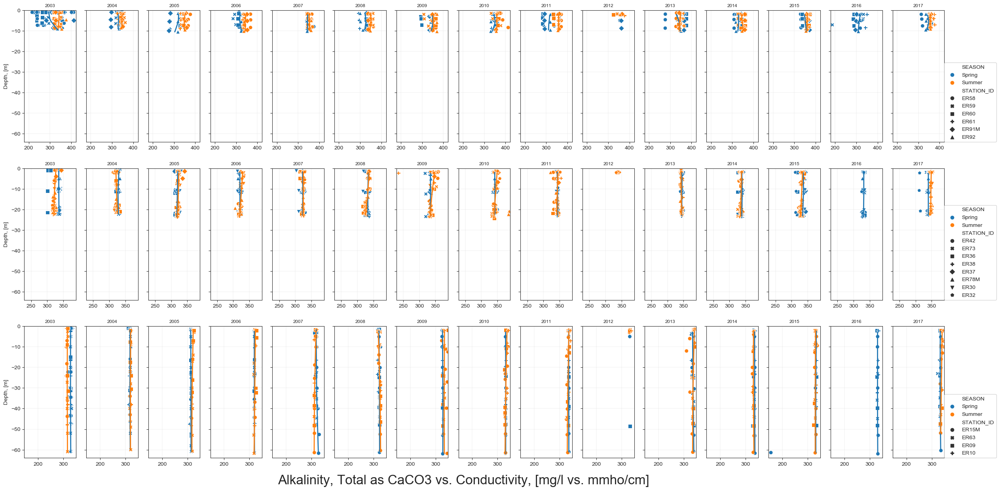

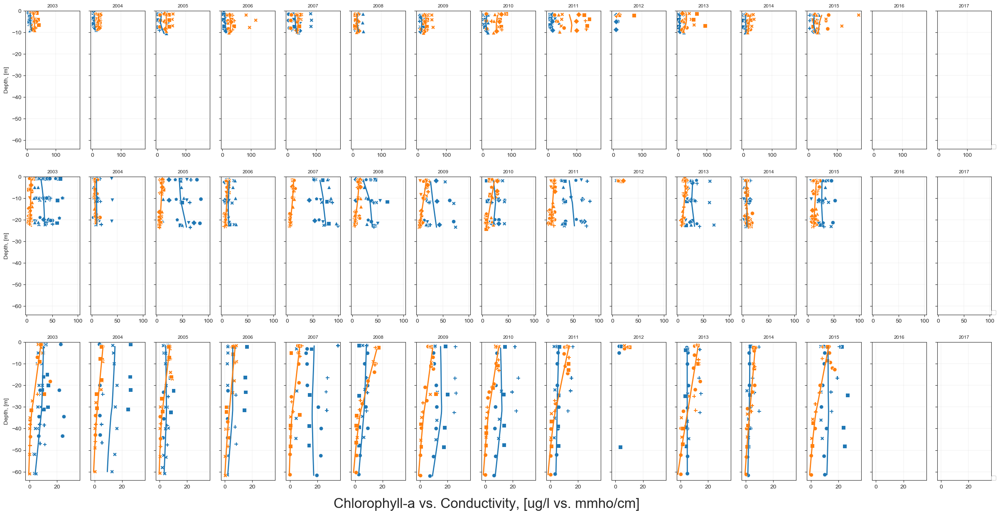

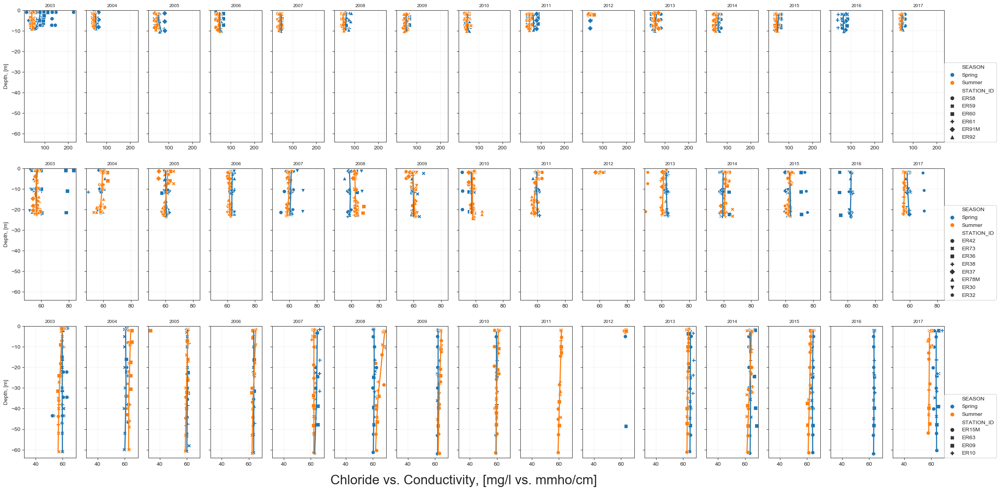

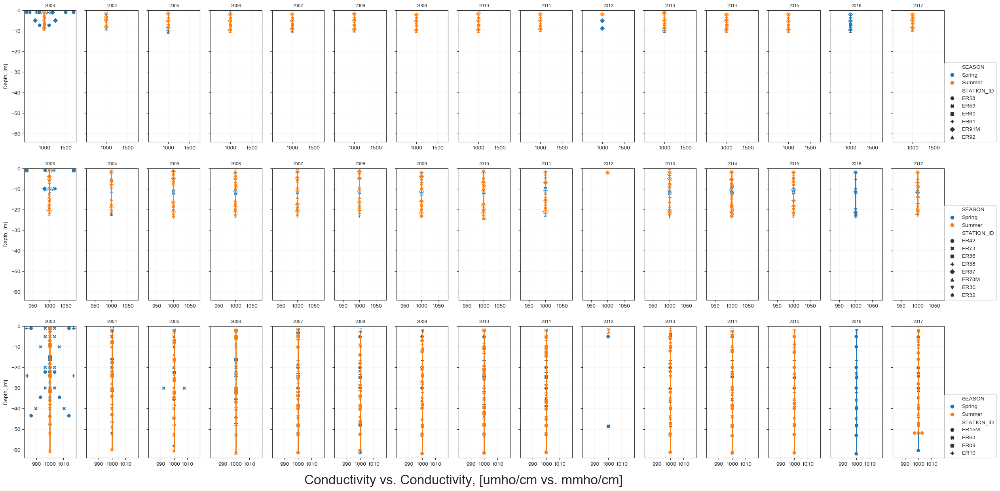

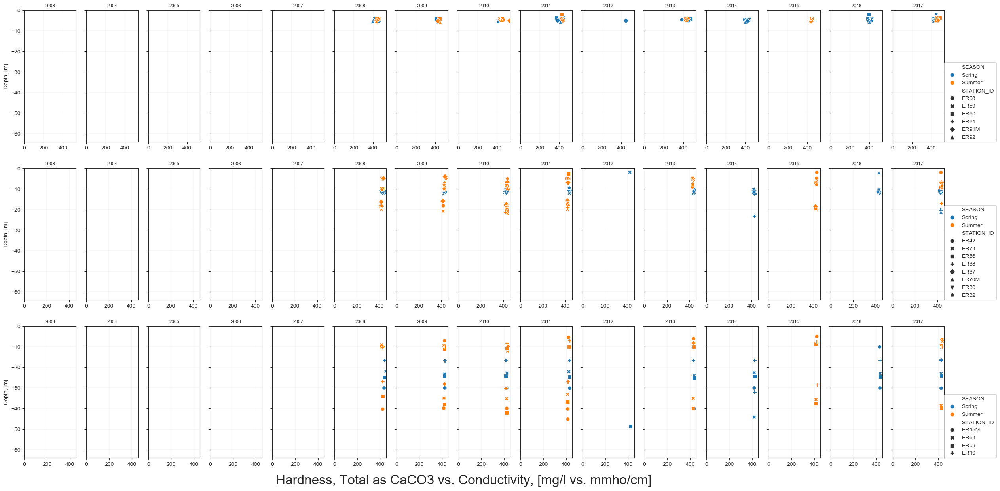

...

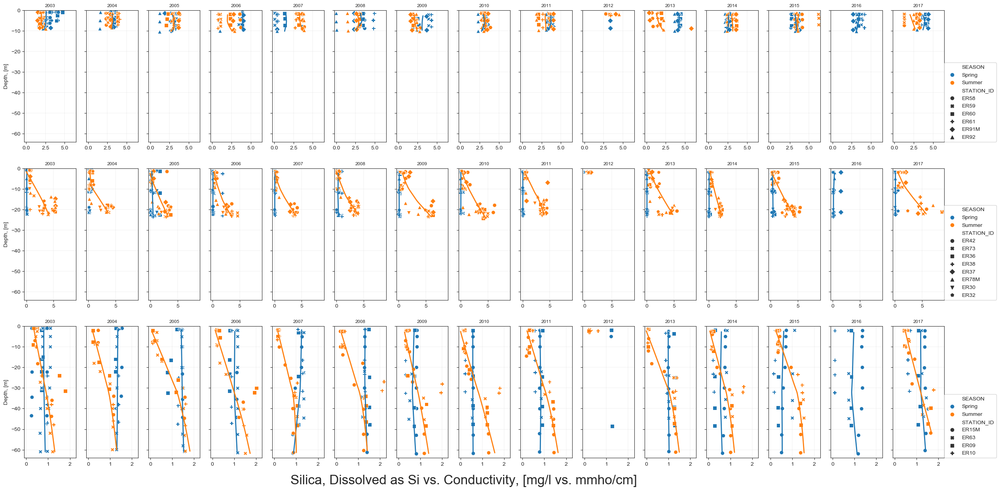

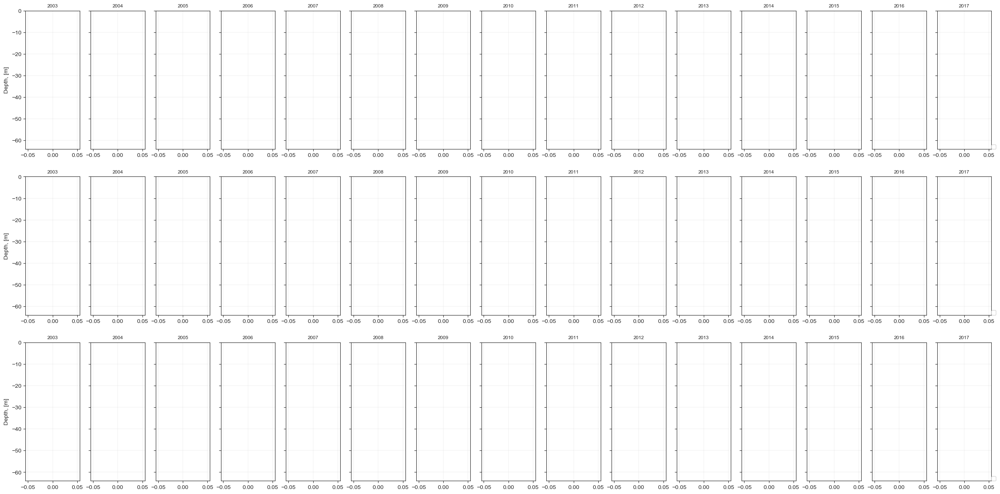

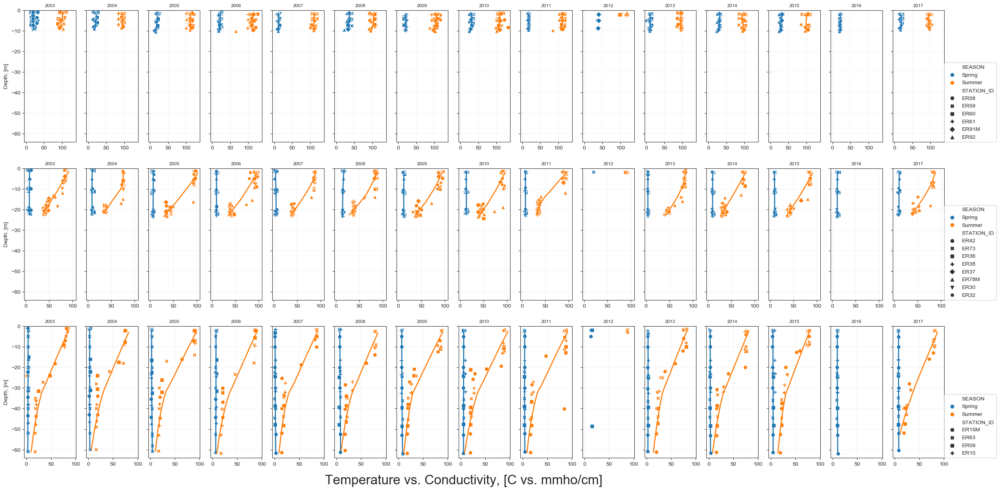

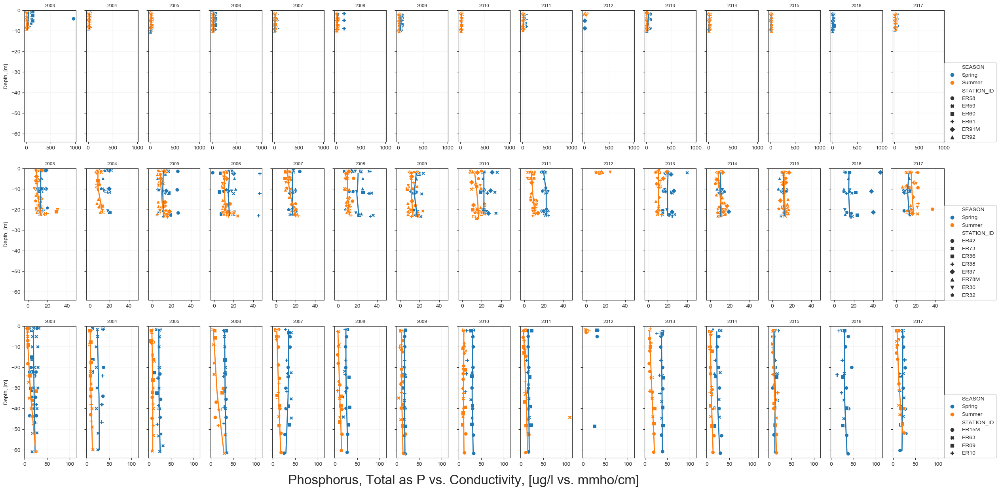

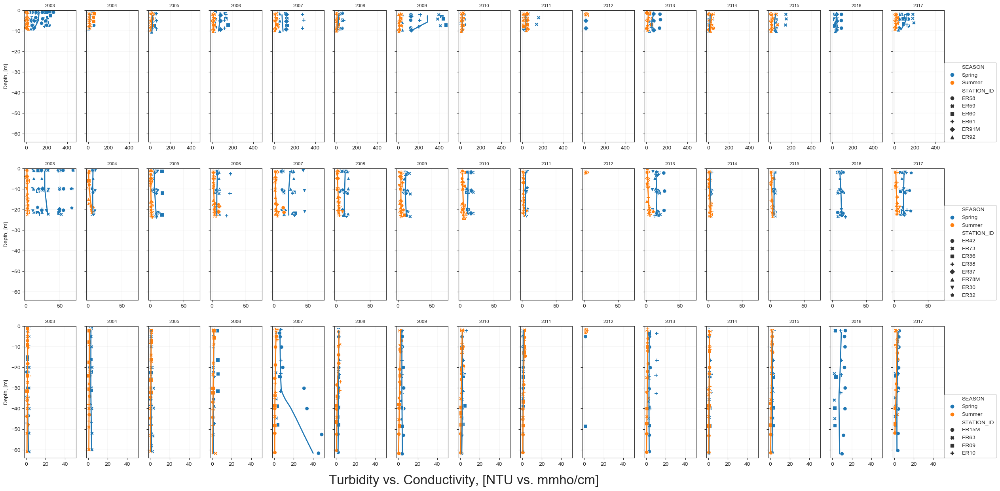

In [34]:
for name in names:
    elem = pd.read_csv('../../measurements/GLNPO/Mass Balance/'+name+'.csv')
    elem = elem[elem.QC_TYPE=='routine field sample']
    elem = elem[~elem.DEPTH_CODE.isin(['Integrated, Spring', 'Integrated, Summer'])]
    elem = elem[elem.YEAR>2002]
    elem.loc[:,'SAMPLE_DEPTH_M'] *= -1
    elem.round({'SAMPLE_DEPTH_M': 0})
    elem = elem[elem['STATION_ID'].isin(eastern_basin + central_basin + western_basin)]
    elem = elem[elem['SEASON'].isin(seasons)]
    elem['elem_conc'] = pd.to_numeric(elem['VALUE_1'], errors='coerce')
    if name=='Cl':
        elem = elem[elem['elem_conc']>8]
    # elem = elem[elem['VALUE_1']>50]
    # elem = elem.groupby(['STATION_ID','YEAR','SEASON', 'SAMPLE_DEPTH_M']).mean()['VALUE_1'].reset_index()
    Ratios = pd.merge(Conductivity, elem, how='left', on=['SAMPLE_DEPTH_M', 'STATION_ID', 'SEASON', 'YEAR', 'SAMPLE_DEPTH_M'])
    Ratios['elemVsConductivity'] = Ratios['elem_conc']/Ratios['Conductivity_conc']*1000
    # %matplotlib osx
    f, axes = plt.subplots(3,15, figsize=(2*15,5*3), dpi=100, sharex=False, sharey=True)
    for j, y in enumerate(years):
        for i, b in enumerate([western_basin, central_basin, eastern_basin]):

            sns_data = Ratios[(Ratios['STATION_ID'].isin(b)) & (Ratios['YEAR']==y)]
            sns.scatterplot(x='elemVsConductivity', y='SAMPLE_DEPTH_M', data=sns_data, ax=axes[i][j], hue='SEASON', style='STATION_ID', s=50)

            for k, s in enumerate(seasons):
                data = sns_data[sns_data['SEASON']==s]
                data = data.sort_values('SAMPLE_DEPTH_M')
                xold = data.groupby('SAMPLE_DEPTH_M').mean()['elemVsConductivity'].reset_index()['SAMPLE_DEPTH_M'].values
                yold = data.groupby('SAMPLE_DEPTH_M').mean()['elemVsConductivity'].reset_index()['elemVsConductivity'].values

    #             tck,u  = interpolate.splprep([xold,yold], s=50000000000)
    #             unew = np.arange(0, 1.00, 0.1)
    #             out = interpolate.splev(unew, tck)
                try:
                    # lowess will return our "smoothed" data with a y value for at every x-value
                    lowess = sm.nonparametric.lowess(yold, xold, frac=1)

                    # unpack the lowess smoothed points to their values
                    lowess_x = list(zip(*lowess))[0]
                    lowess_y = list(zip(*lowess))[1]


                    tck = interpolate.interp1d(lowess_x, lowess_y, kind='linear')
                    unew = np.arange(xold.min(), xold.max(), 1)
                    out = tck(unew)

                    if s=='Spring':
                        clr=sns.color_palette().as_hex()[0]
                    if s=='Summer':
                        clr=sns.color_palette().as_hex()[1]
        #             axes[i][j].scatter(data.VALUE_1, -data.SAMPLE_DEPTH_M, c=clr, edgecolor='w')
        #             sns_data.loc[:,'SAMPLE_DEPTH_M'] *= -1

                    axes[i][j].plot(out, unew, c=clr, lw=2,zorder=1)
                except:
                    pass
    #             axes[i][j].fill_betweenx(-data['z'], data['val']['mean']-data['val']['std'], data['val']['mean']+data['val']['std'], alpha=0.5, lw=0., color=clr)
    #             axes[i][j].set_xlim(0,30)
                axes[i][j].set_title(" ".join([str(y)]), fontsize='small')
                axes[i][j].set_ylim(-64,0)
                axes[i][j].grid(lw=0.2)
                axes[i][j].legend()
                axes[i][j].legend_.remove()
                axes[i][j].set_xlabel('')
                axes[i][j].set_ylabel('')
    #             axes[i][j].set_xlim(np.floor(axes[i][j].get_xlim()[0]), np.ceil(axes[i][j].get_xlim()[1]))
    #             for c,st in zip(sns.color_palette().as_hex()[:len(b)],b):
    #                 axes[i][j].plot(data[data['STATION_ID']==st].VALUE_1, data[data['STATION_ID']==st].SAMPLE_DEPTH_M,c=c, lw=0.3, label='')
    axes[0][14].legend(loc=(1,0))
    axes[1][14].legend(loc=(1,0))
    axes[2][14].legend(loc=(1,0))

    # axes[0][0].text(130,10, 'Chloride concnetrations, [mg/L]', fontsize=24)

    # axes[2][2].set_xlim(16,18)
    # axes[2][0].set_xlim(16,17.5)

    limits = []
    for line in axes:
        low = [a.get_xlim()[0] for a in line]
        high = [a.get_xlim()[1] for a in line]
        limits.append((min(low),max(high)))


    axes[0][0].set_ylabel('Depth, [m]')
    axes[1][0].set_ylabel('Depth, [m]')
    axes[2][0].set_ylabel('Depth, [m]')
    try:
        axes[2][0].text(8.5,-0.2, elem.ANALYTE_1.values[0] +' vs. Conductivity, ' + '['+elem.UNITS_1.values[0]+' vs. mmho/cm]', fontsize=24, horizontalalignment='center', transform=axes[2][0].transAxes)
        f.savefig('Mass Balance/GLENDA/All Stations/2012-2015/Glenda vs Conductivity/'+elem.ANALYTE_1.values[0] +' vs. Conductivity no scales.pdf')

        for i,ax in enumerate(axes[0]):
            axes[0][i].set_xlim(limits[0])
            axes[1][i].set_xlim(limits[1])
            axes[2][i].set_xlim(limits[2])

        f.savefig('Mass Balance/GLENDA/All Stations/2012-2015/Glenda vs Conductivity/'+elem.ANALYTE_1.values[0] +' vs. Conductivity.pdf')
    except:
        print(name)



In [21]:
Cl.UNITS_1.values[0]

'mg/l'

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles wi

NH3N


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles wi

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles wi

SiTotal


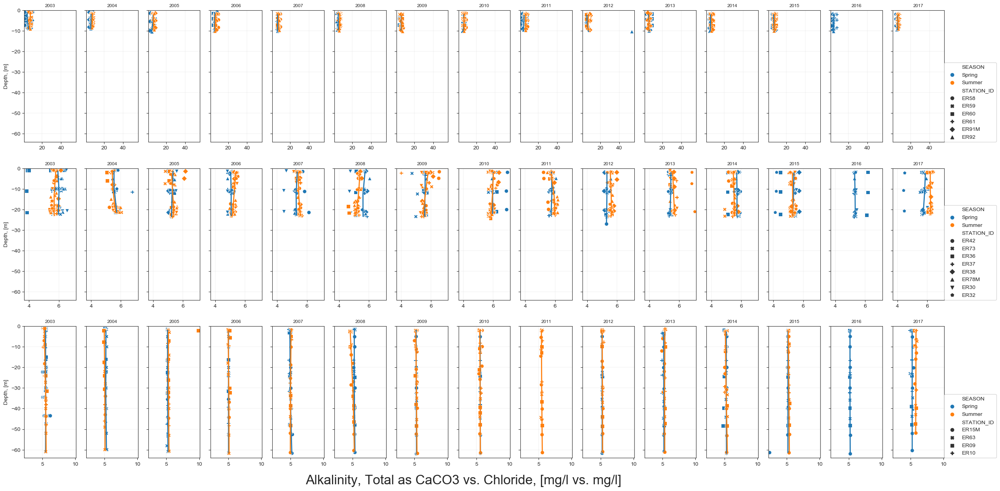

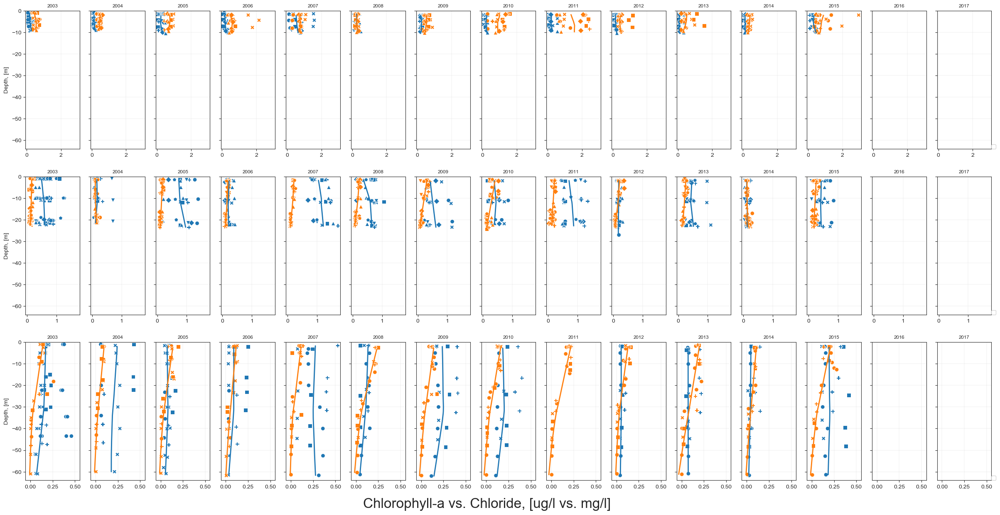

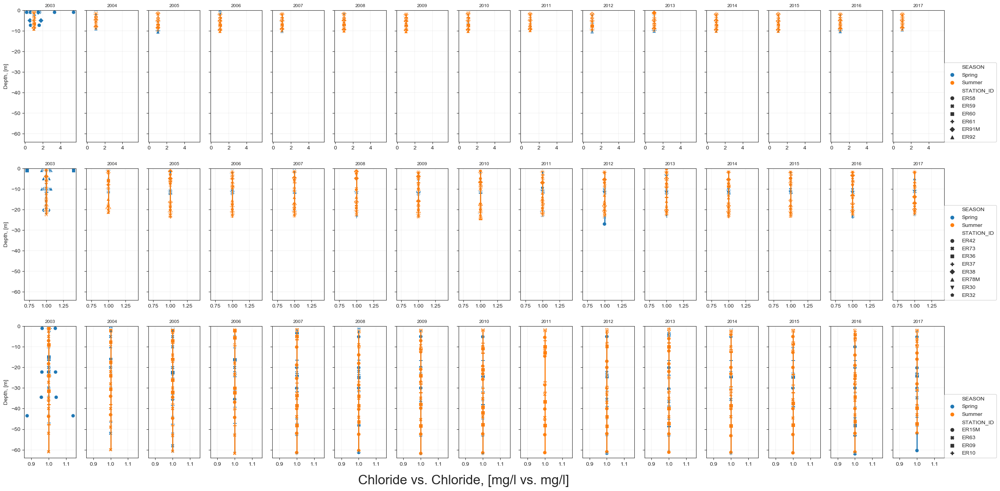

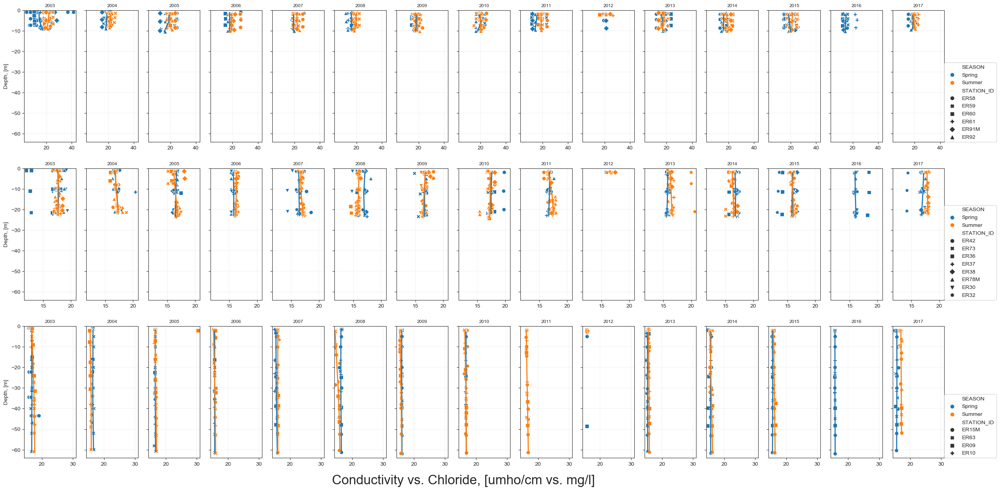

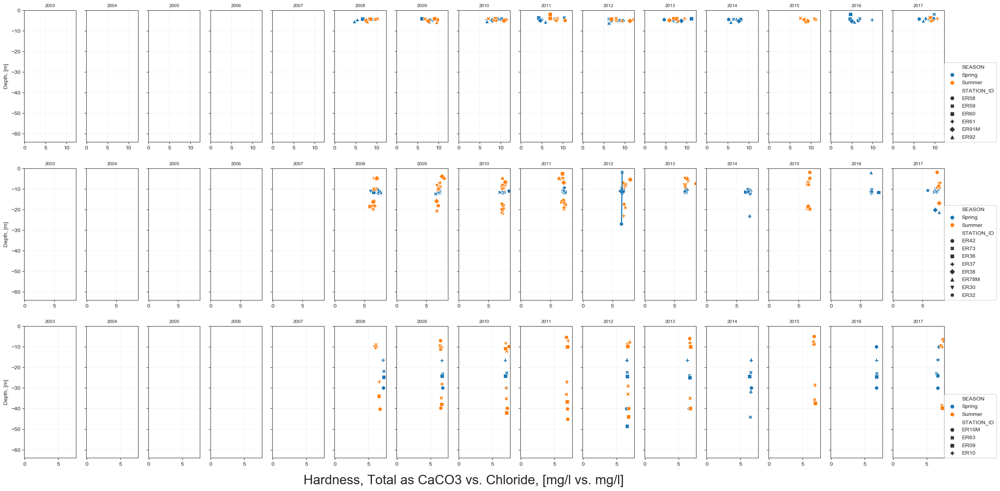

...

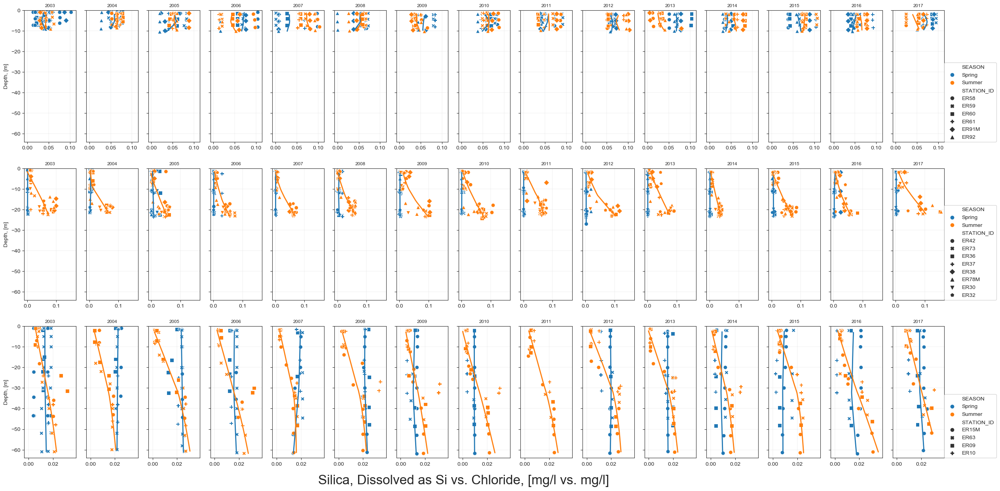

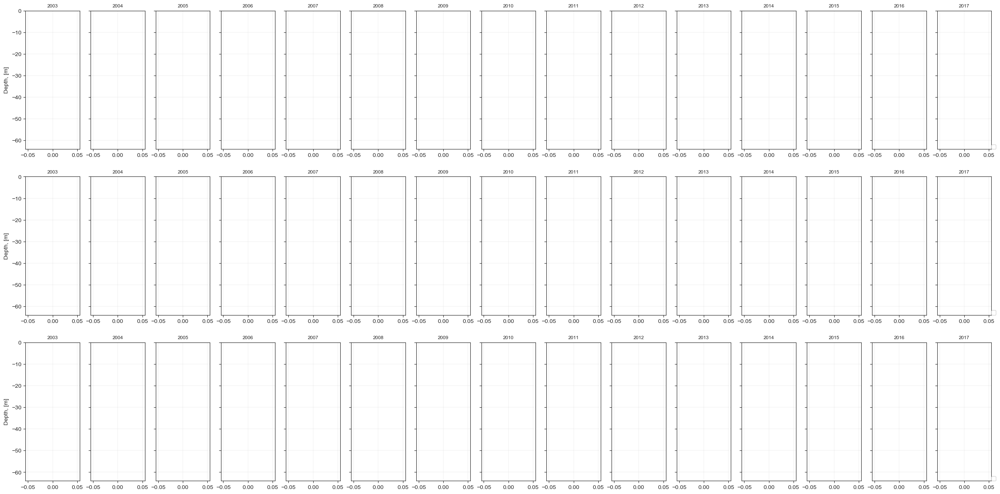

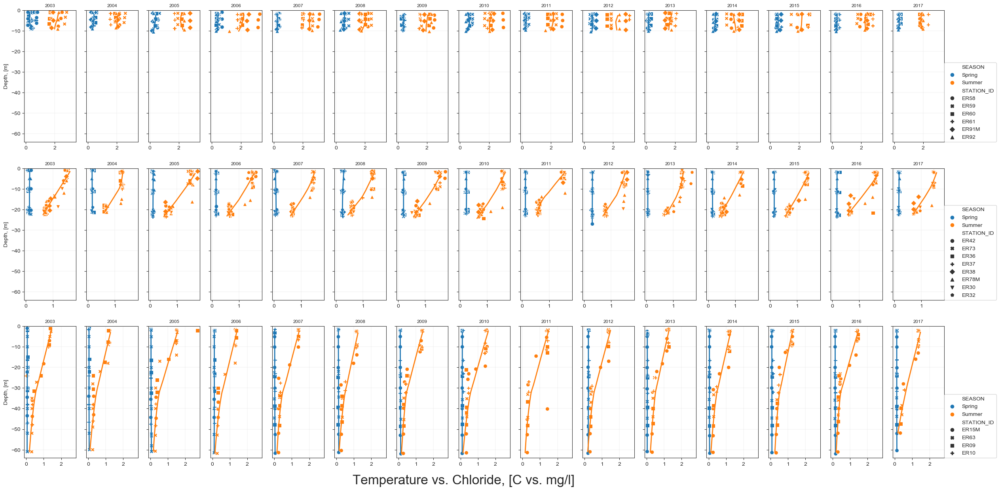

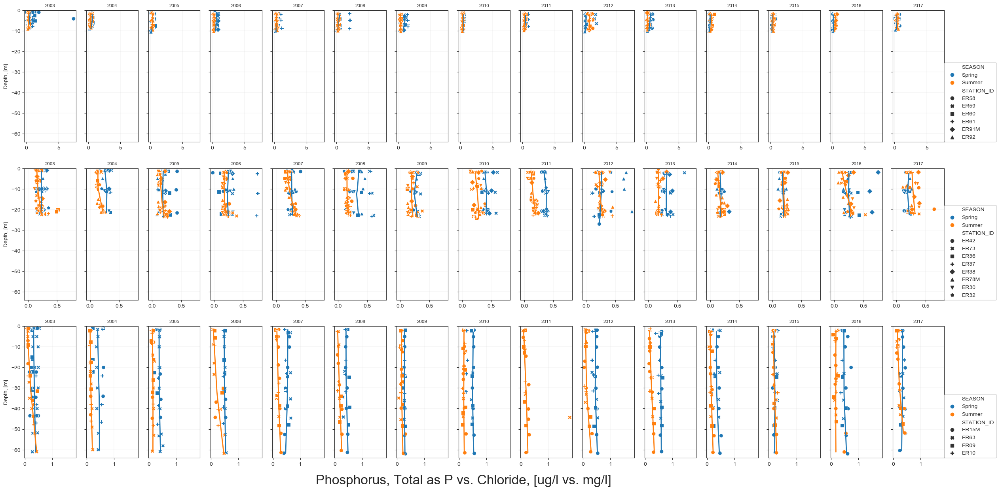

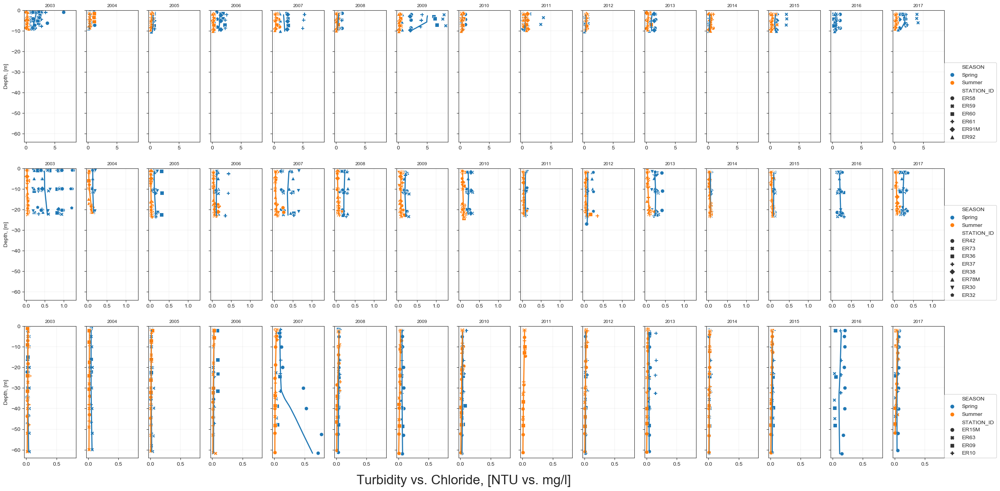

In [40]:
for name in names:
    elem = pd.read_csv('../../measurements/GLNPO/Mass Balance/'+name+'.csv')
    elem = elem[elem.QC_TYPE=='routine field sample']
    elem = elem[~elem.DEPTH_CODE.isin(['Integrated, Spring', 'Integrated, Summer'])]
    elem = elem[elem.YEAR>2002]
    elem.loc[:,'SAMPLE_DEPTH_M'] *= -1
    elem.round({'SAMPLE_DEPTH_M': 0})
    elem = elem[elem['STATION_ID'].isin(eastern_basin + central_basin + western_basin)]
    elem = elem[elem['SEASON'].isin(seasons)]
    elem['elem_conc'] = pd.to_numeric(elem['VALUE_1'], errors='coerce')
    if name=='Cl':
        elem = elem[elem['elem_conc']>8]
    # elem = elem[elem['VALUE_1']>50]
    # elem = elem.groupby(['STATION_ID','YEAR','SEASON', 'SAMPLE_DEPTH_M']).mean()['VALUE_1'].reset_index()
    Ratios = pd.merge(Cl, elem, how='left', on=['SAMPLE_DEPTH_M', 'STATION_ID', 'SEASON', 'YEAR', 'SAMPLE_DEPTH_M'])
    Ratios['elemVsCl'] = Ratios['elem_conc']/Ratios['Cl_conc']
    # %matplotlib osx
    f, axes = plt.subplots(3,15, figsize=(2*15,5*3), dpi=100, sharex=False, sharey=True)
    for j, y in enumerate(years):
        for i, b in enumerate([western_basin, central_basin, eastern_basin]):

            sns_data = Ratios[(Ratios['STATION_ID'].isin(b)) & (Ratios['YEAR']==y)]
            sns.scatterplot(x='elemVsCl', y='SAMPLE_DEPTH_M', data=sns_data, ax=axes[i][j], hue='SEASON', hue_order=seasons, style='STATION_ID', s=50)

            for k, s in enumerate(seasons):
                data = sns_data[sns_data['SEASON']==s]
                data = data.sort_values('SAMPLE_DEPTH_M')
                xold = data.groupby('SAMPLE_DEPTH_M').mean()['elemVsCl'].reset_index()['SAMPLE_DEPTH_M'].values
                yold = data.groupby('SAMPLE_DEPTH_M').mean()['elemVsCl'].reset_index()['elemVsCl'].values

    #             tck,u  = interpolate.splprep([xold,yold], s=50000000000)
    #             unew = np.arange(0, 1.00, 0.1)
    #             out = interpolate.splev(unew, tck)
                try:
                    # lowess will return our "smoothed" data with a y value for at every x-value
                    lowess = sm.nonparametric.lowess(yold, xold, frac=1)

                    # unpack the lowess smoothed points to their values
                    lowess_x = list(zip(*lowess))[0]
                    lowess_y = list(zip(*lowess))[1]


                    tck = interpolate.interp1d(lowess_x, lowess_y, kind='linear')
                    unew = np.arange(xold.min(), xold.max(), 1)
                    out = tck(unew)

                    if s=='Spring':
                        clr=sns.color_palette().as_hex()[0]
                    if s=='Summer':
                        clr=sns.color_palette().as_hex()[1]
        #             axes[i][j].scatter(data.VALUE_1, -data.SAMPLE_DEPTH_M, c=clr, edgecolor='w')
        #             sns_data.loc[:,'SAMPLE_DEPTH_M'] *= -1

                    axes[i][j].plot(out, unew, c=clr, lw=2,zorder=1)
                except:
                    pass
    #             axes[i][j].fill_betweenx(-data['z'], data['val']['mean']-data['val']['std'], data['val']['mean']+data['val']['std'], alpha=0.5, lw=0., color=clr)
    #             axes[i][j].set_xlim(0,30)
                axes[i][j].set_title(" ".join([str(y)]), fontsize='small')
                axes[i][j].set_ylim(-64,0)
                axes[i][j].grid(lw=0.2)
                axes[i][j].legend()
                axes[i][j].legend_.remove()
                axes[i][j].set_xlabel('')
                axes[i][j].set_ylabel('')
    #             axes[i][j].set_xlim(np.floor(axes[i][j].get_xlim()[0]), np.ceil(axes[i][j].get_xlim()[1]))
    #             for c,st in zip(sns.color_palette().as_hex()[:len(b)],b):
    #                 axes[i][j].plot(data[data['STATION_ID']==st].VALUE_1, data[data['STATION_ID']==st].SAMPLE_DEPTH_M,c=c, lw=0.3, label='')
    axes[0][14].legend(loc=(1,0))
    axes[1][14].legend(loc=(1,0))
    axes[2][14].legend(loc=(1,0))

    # axes[0][0].text(130,10, 'Chloride concnetrations, [mg/L]', fontsize=24)

    # axes[2][2].set_xlim(16,18)
    # axes[2][0].set_xlim(16,17.5)

    limits = []
    for line in axes:
        low = [a.get_xlim()[0] for a in line]
        high = [a.get_xlim()[1] for a in line]
        limits.append((min(low),max(high)))


    axes[0][0].set_ylabel('Depth, [m]')
    axes[1][0].set_ylabel('Depth, [m]')
    axes[2][0].set_ylabel('Depth, [m]')
    try:
        axes[2][0].text(8.5,-0.2, elem.ANALYTE_1.values[0] +' vs. Chloride, ' + '['+elem.UNITS_1.values[0]+' vs. mg/l]', fontsize=24, horizontalalignment='center', transform=axes[2][0].transAxes)
        f.savefig('Mass Balance/GLENDA/All Stations/2012-2015/Glenda vs Cl/'+elem.ANALYTE_1.values[0] +' vs. Cl no scales.pdf')

        for i,ax in enumerate(axes[0]):
            axes[0][i].set_xlim(limits[0])
            axes[1][i].set_xlim(limits[1])
            axes[2][i].set_xlim(limits[2])

        f.savefig('Mass Balance/GLENDA/All Stations/2012-2015/Glenda vs Cl/'+elem.ANALYTE_1.values[0] +' vs. Cl.pdf')
    except:
        print(name)

